# A Walk Through The scPortrait Ecosystem

This notebook will introduce you to the scPortrait ecosystem and give you a complete working example of how to use scPortrait. It will walk you through the following steps of the scPortrait workflow:

1. **Segmentation**: Generates masks for the segmentation of input images into individual cells

2. **Extraction**: The segmentation masks are applied to extract single-cell images for all cells in the input images. Images of individual cells are rescaled to [0, 1] per channel.

3. **Featurization**: The image-based phenotype of each individual cell in the extracted single-cell dataset is featurized using the specified featurization method. Multiple featurization runs can be performed on the same dataset using different methods. Here we utilize the pretrained binary classifier from the original [SPARCS manuscript](https://doi.org/10.1101/2023.06.01.542416) that identifies individual cells defective in a biological process called "autophagy". 

4. **Selection**: Cutting instructions for the isolation of selected individual cells by laser microdissection are generated. The cutting shapes are written to an ``.xml`` file which can be loaded on a Leica LMD7 microscope for automated cell excision.

The data used in this notebook was previously stitched using the stitching workflow in [SPARCStools](https://github.com/MannLabs/SPARCStools). Please see the notebook [here](https://mannlabs.github.io/SPARCStools/html/pages/notebooks/example_stitching_notebook.html).

## Import Required Libraries

First we need to import all of the python functions we require to run the pipeline.

In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np

from scportrait.pipeline.featurization import MLClusterClassifier
from scportrait.pipeline.extraction import HDF5CellExtraction
from scportrait.pipeline.project import Project
from scportrait.pipeline.segmentation.workflows import WGASegmentation
from scportrait.pipeline.selection import LMDSelection

from scportrait.data._datasets import dataset_1  # to download example dataset
import scportrait
import yaml
from IPython.display import Markdown

## Generate the Project Structure

Executing this code will generate a new scPortrait project in the designated location. Each scPortrait project has the following general structure:

                .
                ├── classification
                │   └── classifier_name
                │       └── processing.log
                ├── config.yml
                ├── extraction
                ├── segmentation
                └── processing.log

In [4]:
project_location = "../example_projects/example_1/project_walkthrough"

project = Project(
    os.path.abspath(project_location),
    config_path="../example_projects/example_1/config_example1_WGASegmentation.yml",
    overwrite=True,
    debug=True,
    segmentation_f=WGASegmentation,
    extraction_f=HDF5CellExtraction,
    featurization_f=MLClusterClassifier,
    selection_f=LMDSelection,
)

Updating project config file.
[20/03/2025 14:28:39] Loading config from /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_walkthrough/config.yml
INFO     The Zarr backing store has been changed from None the new file path:                                      
         /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_walkthroug
         h/scportrait.sdata                                                                                        
[20/03/2025 14:28:39] No cache directory specified in config using current working directory /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/tutorials.
[20/03/2025 14:28:39] Compression algorithm for extracted single-cell images: lzf
[20/03/2025 14:28:39] No cache directory specified in config using current working directory /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/tutorials.


## Load Imaging Data

Once we have generated our project structure we next need to load our imaging data. There are several different ways to do this. 

1. you can load the images directly from file by specifying a list of filepaths
2. you can load the images from numpy arrays that are already loaded into memory

Here it is important that you load the channels in the following order: Nucleus, Cellmembrane, others

In this particular example we are utilizing images from U2OS cells which are stained with Hoechst 33342 to visualize nuclei and express Lck-mNeon to visualize the cellular membrane and LC3B-mcherry, a fluroescently tagged protein relevant for visualizing the biological process of autophagy. The cells have not been stimulated to induce autophagy and should be autophagy defective.

### Method 1: loading images from file

In [3]:
path = dataset_1()

images = [
    f"{path}/Ch1.tif",
    f"{path}/Ch2.tif",
    f"{path}/Ch3.tif",
]

project.load_input_from_tif_files(images, channel_names=["Nucleus", "Cytosol Marker", "LC3B"])

[20/03/2025 14:28:20] Output location /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/scportrait.sdata already exists. Overwriting.
INFO     The Zarr backing store has been changed from None the new file path:                                      
         /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/scport
         rait.sdata                                                                                                


[20/03/2025 14:28:20] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/tutorials/Project_d7o0m93l for Project
[20/03/2025 14:28:20] Image input_image written to sdata object.
[20/03/2025 14:28:20] Cleaned up temporary directory at <TemporaryDirectory '/Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/tutorials/Project_d7o0m93l'>


### Method 2: loading images from numpy array

To simulate the case where the images you want to load are already loaded as a numpy array, we first convert the images to a numpy array and then pass this array to the project instead of only providing the image paths.

In [4]:
from tifffile import imread

path = dataset_1()

images = [
    f"{path}/Ch1.tif",
    f"{path}/Ch2.tif",
    f"{path}/Ch3.tif",
]

image_arrays = np.array([imread(path) for path in images])

project.load_input_from_array(image_arrays, channel_names=["Nucleus", "Cytosol Marker", "LC3B"])

[14/03/2025 17:50:33] Output location /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/scportrait.sdata already exists. Overwriting.
INFO     The Zarr backing store has been changed from None the new file path:                                      
         /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/scport
         rait.sdata                                                                                                
[14/03/2025 17:50:34] Image input_image written to sdata object.


### Looking at the loaded images

The loaded images are accesible via the input_image parameter of the project. They are saved into the underlying spatialdata object.

In [5]:
project.input_image

<xarray.DataArray 'image' (c: 3, y: 3040, x: 3038)> Size: 55MB
dask.array<from-zarr, shape=(3, 3040, 3038), dtype=uint16, chunksize=(1, 1000, 1000), chunktype=numpy.ndarray>
Coordinates:
  * c        (c) <U14 168B 'Nucleus' 'Cytosol Marker' 'LC3B'
  * y        (y) float64 24kB 0.5 1.5 2.5 3.5 ... 3.038e+03 3.038e+03 3.04e+03
  * x        (x) float64 24kB 0.5 1.5 2.5 3.5 ... 3.036e+03 3.036e+03 3.038e+03
Attributes:
    transform:  {'global': Identity }

You can easily visualize a center cropped image excerpt using the `.plot_input_image()` helper function.

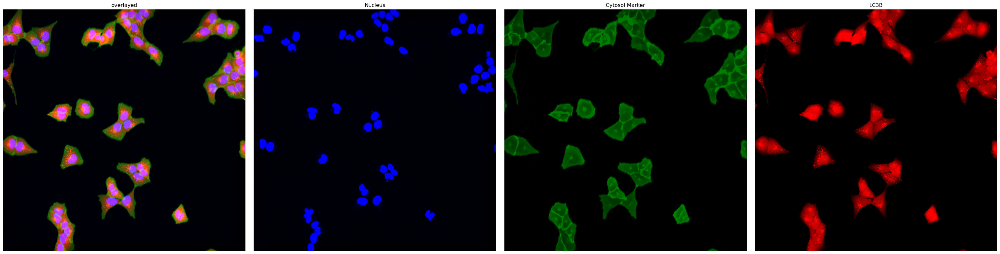

In [6]:
project.plot_input_image()

Alternatively, you can also visualize the input images as well as all other objects saved in a spatialdata object in an interactive napari viewer. This will only work if running locally.

In [7]:
project.view_sdata()

After finishing with the interactive viewing you can close the viewer with `.close_interactive_viewer()`. This will also write any additional elements created back to disk.

In [8]:
project.close_interactive_viewer()

Writing the following manually added files to the sdata object: []


## Generating a Segmentation

scPortrait has different segmentation workflows between which you can choose. If none of them fit your needs you can also easily write your own. 

Here we will demonstrate the CPU based classical segmentation method that was also utilized in the manuscript. 

We define the segmentation method to be used when we initialize the project. In this case we used the `WGASegmentation` method. The `ShardedWGASegmentation` works very similarily but allows you to process several image chunks in parallel for more efficient computation on large input images.

By specifying `debug = True` we can see intermediate output results from the segmentation. 

The `WGASegmentation` method relies on parameters specified in the `config.yml` we loaded when initializing our project.


In [9]:
display(Markdown(f"```yaml\n{yaml.dump(project.segmentation_f.config, default_flow_style=False)}\n```"))

```yaml
cache: /Users/sophia/Documents/GitHub/scPortrait/docs/pages/notebooks
chunk_size: 50
cytosol_segmentation:
  dilation: 7
  erosion: 2
  lower_quantile_normalization: 0.01
  max_clip: 0.2
  max_size: 6000
  min_clip: 0
  min_size: 200
  threshold: 0.05
  upper_quantile_normalization: 0.99
filter_masks_size: true
input_channels: 3
lower_quantile_normalization: 0.001
median_filter_size: 4
nucleus_segmentation:
  contact_filter: 0.5
  dilation: 0
  lower_quantile_normalization: 0.01
  max_size: 1000
  median_block: 41
  median_step: 4
  min_distance: 8
  min_size: 200
  peak_footprint: 7
  speckle_kernel: 9
  threshold: 0.2
  upper_quantile_normalization: 0.99
upper_quantile_normalization: 0.999

```

By passing the parameter ``debug = True`` we tell scPortrait to also generate intermediate outputs which we can look at to see the different segmentation steps. It is only recommended to do this for debugging or visualization purposes as it will utilize more memory and be slower.

For the ``WGASegmentation`` method the intermediate outputs that are displayed are the following: 

1. percentile normalized input images for each of the three channels (3 images)
2. median normalized input images (this slightl smooths the images for a better segmentation result) (3 images)
3. histogram showing the intensity distribution for nuclear and cytosolic channel (2 plots)
4. generated mask after applying nuclear thresholding
5. nuclear thresholding mask with calculated centers for each detected nucleus
6. fast marching map with nuclei centers indicated in red
7. segmented individual nuclei (2 different visualizations)
8. starting nucleus mask for filtering
9. histrogram showing size distribution of segmented nuclei
10. segmentation mask with too small nuclei shown in red
11. segmentation mask with too large nuclei shown in red
12. WGA thresholding mask
13. WGA potential map
14. WGA fast marching results
15. Watershed results with nuclear centers shown in red
15. WGA mask
16. Cytosol size distribution
10. cytosol mask with too small cells shown in red
11. cytosol mask with too large cells shown in red

[14/03/2025 17:50:36] Normalization of the input image will be performed.
[14/03/2025 17:50:36] Normalizing each channel to the same range
[14/03/2025 17:50:37] Performing median filtering on input image
[14/03/2025 17:50:47] Percentile normalization of nucleus input image to range 0.01, 0.99
[14/03/2025 17:50:47] Normalizing each channel to the same range
[14/03/2025 17:50:48] Using local thresholding with a threshold of 0.2 to calculate nucleus mask.


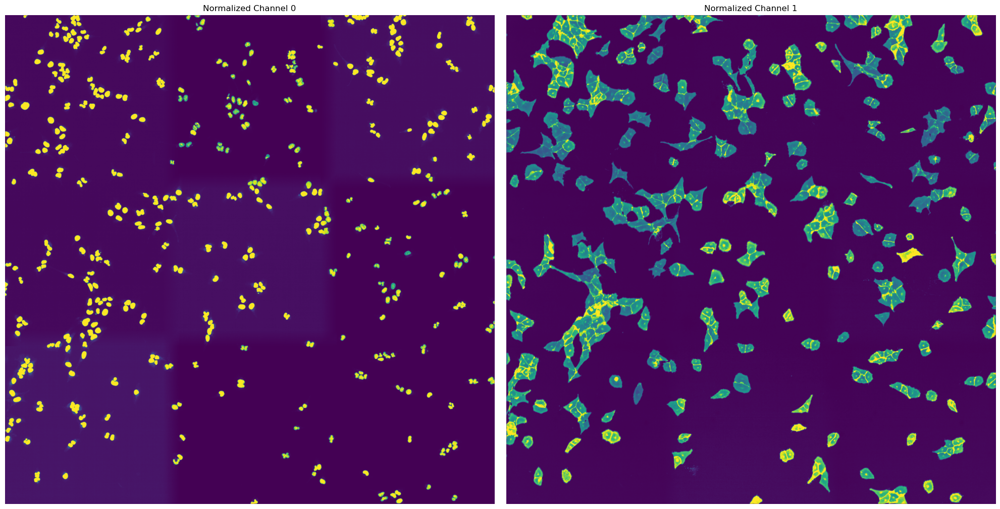

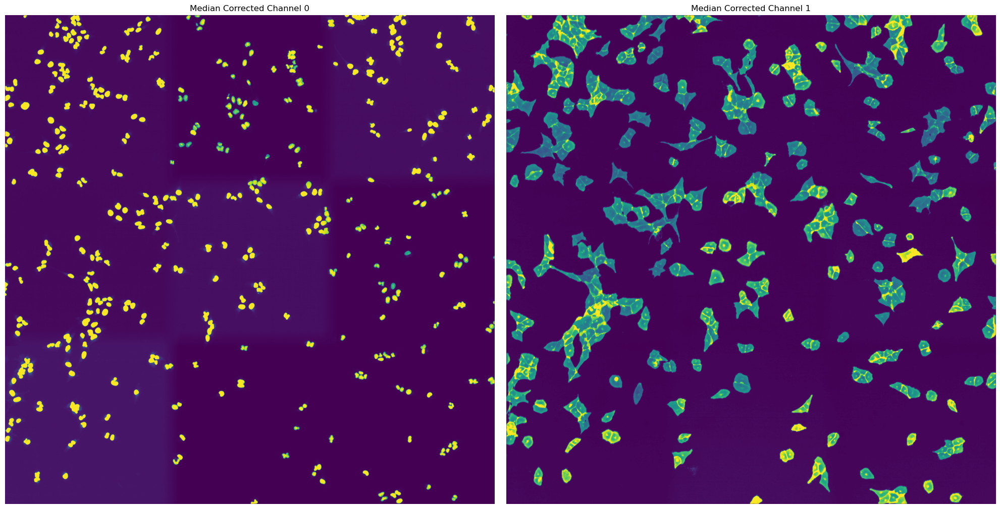

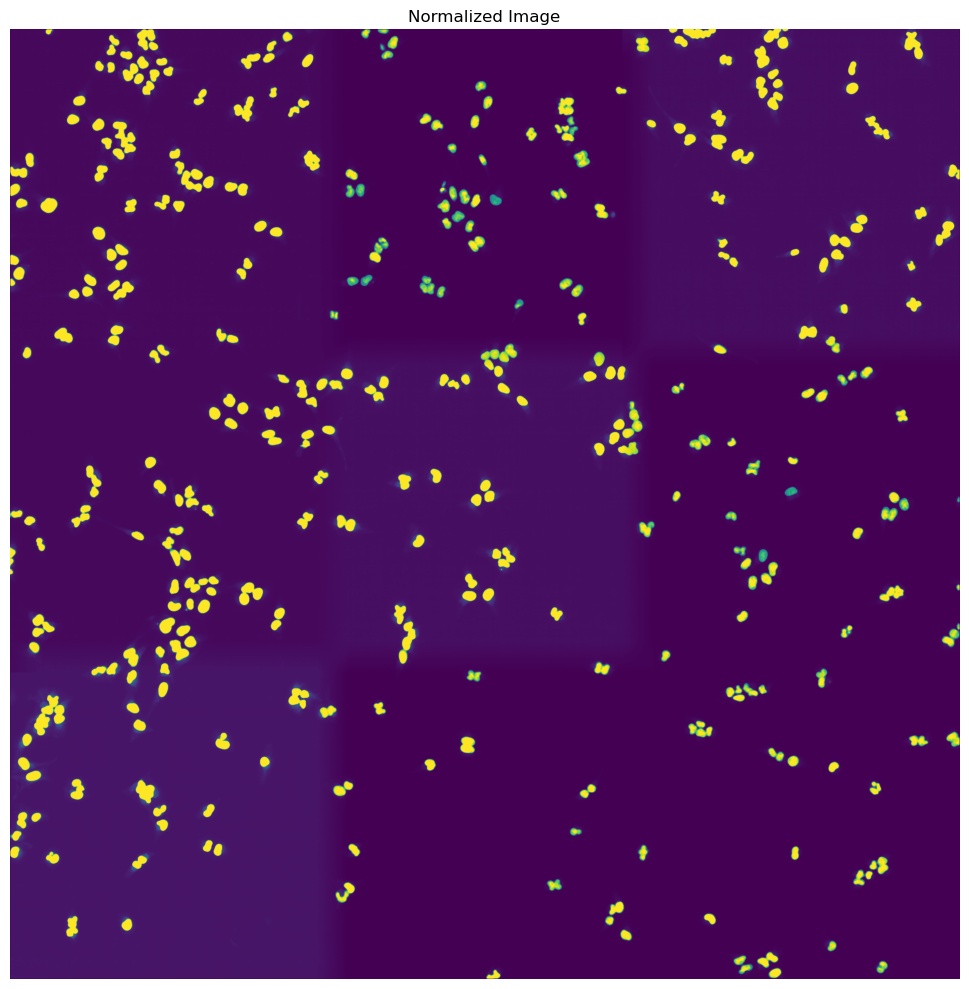

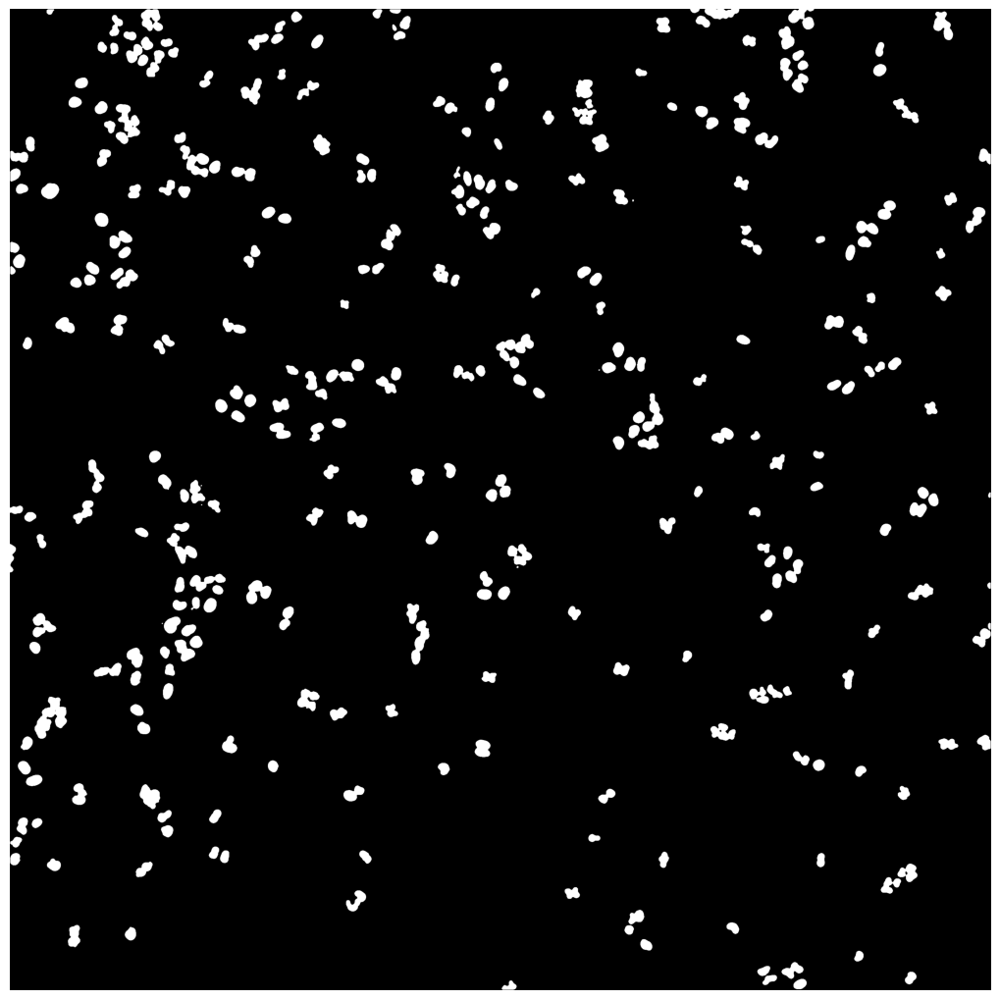

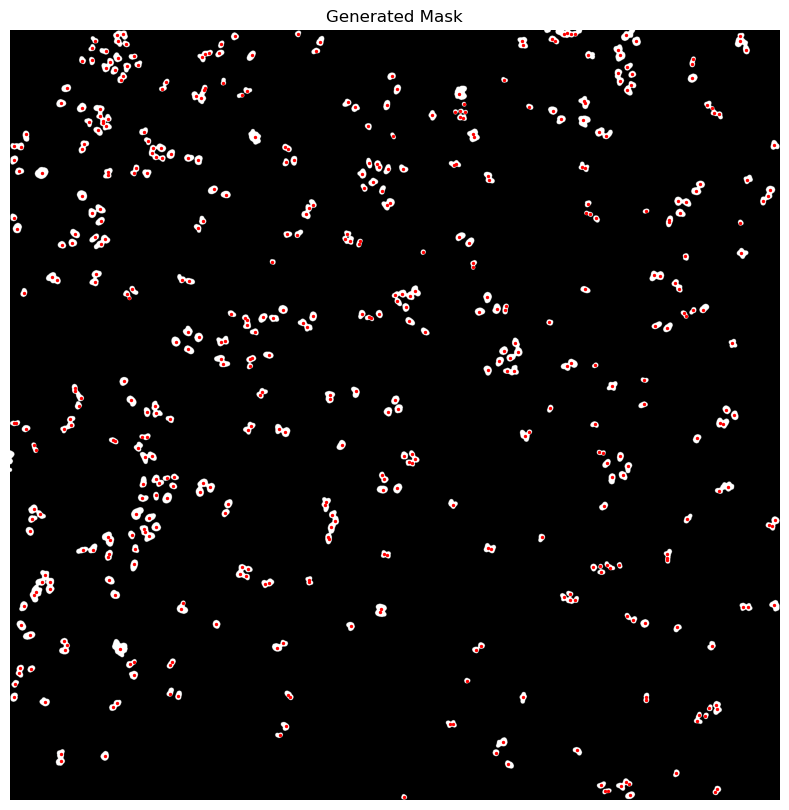

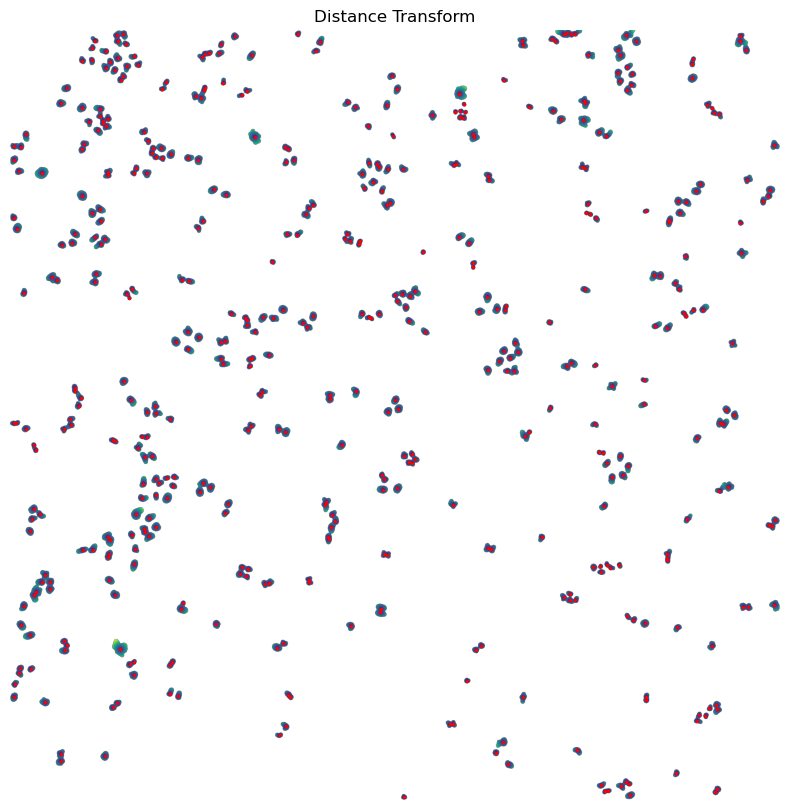

[14/03/2025 17:51:05] Performing filtering of nucleus with specified thresholds [200, 1000] from config file.
[14/03/2025 17:51:05] Removed 47 nuclei as they fell outside of the threshold range [200, 1000].
[14/03/2025 17:51:06] Total time to perform nucleus size filtering: 1.02384614944458 seconds


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


[14/03/2025 17:51:07] Filtered out 6 nuclei due to contact filtering.
[14/03/2025 17:51:07] Normalizing each channel to the same range
[14/03/2025 17:51:10] Cytosol Potential Mask generated.
[14/03/2025 17:51:11] Performing filtering of cytosol with specified thresholds [200, 6000] from config file.


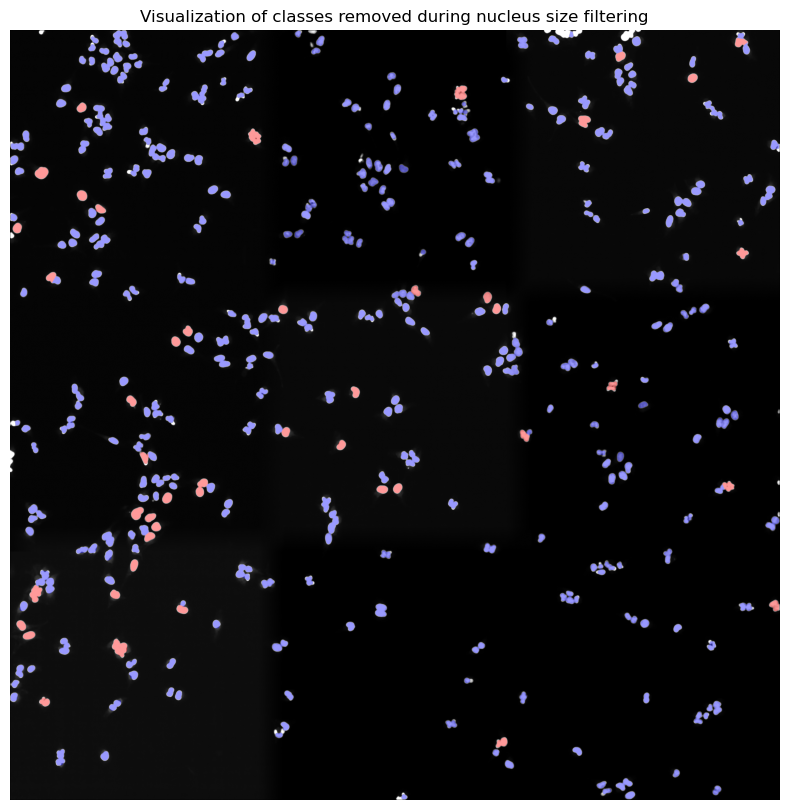

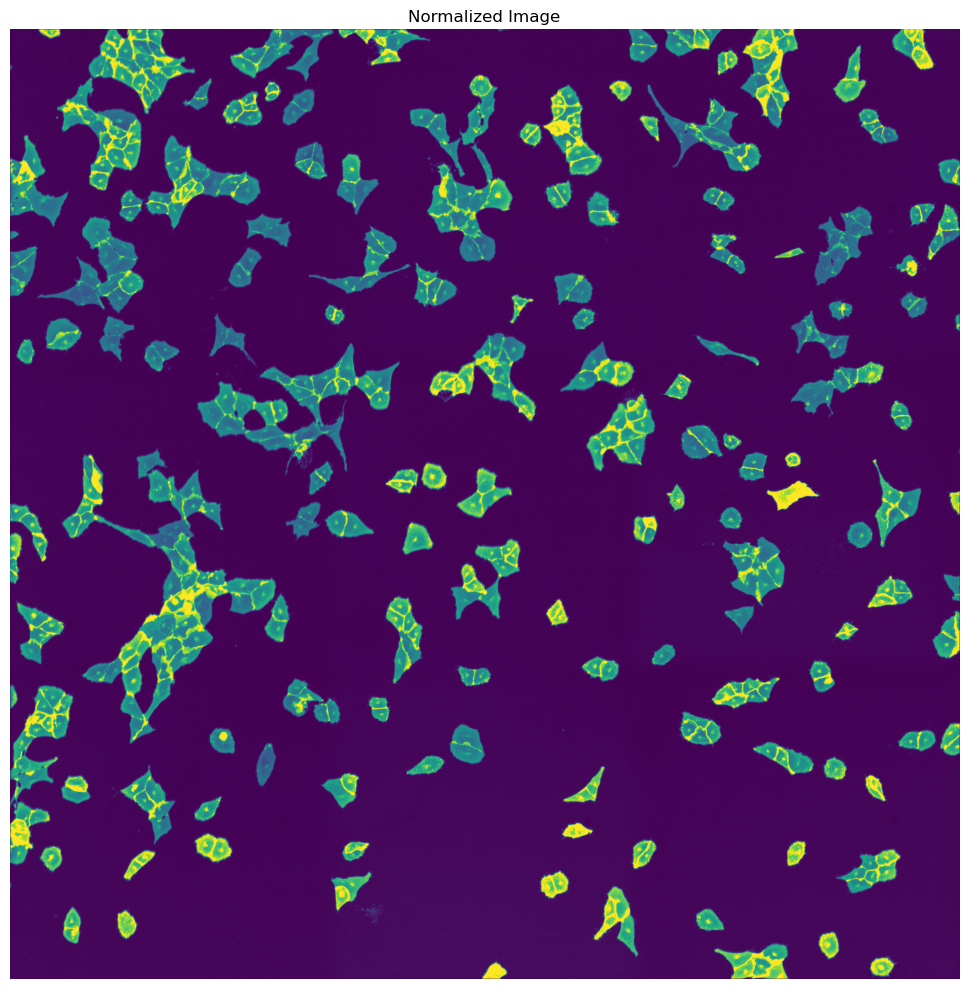

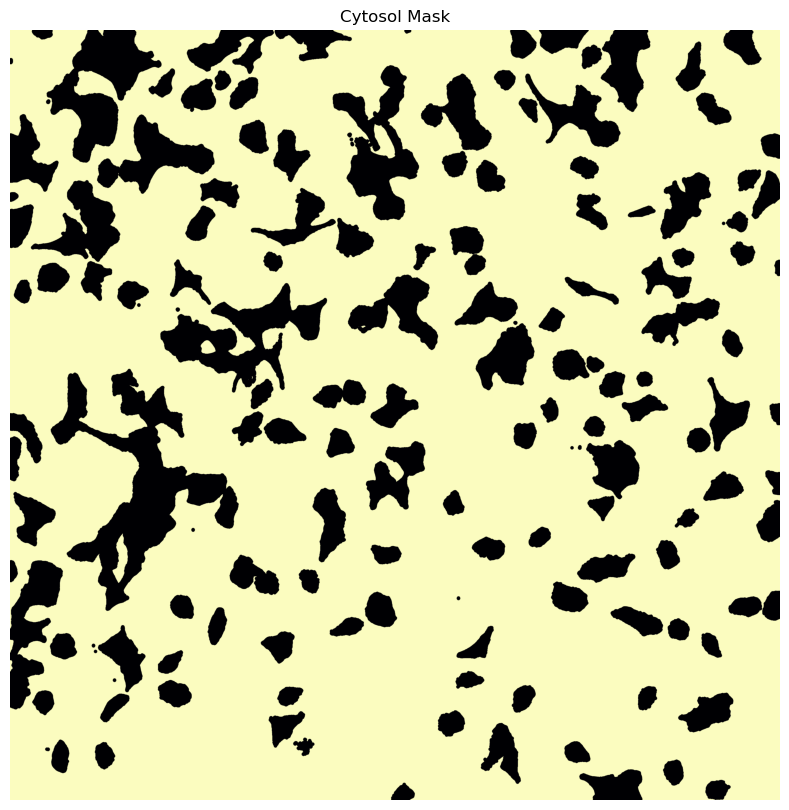

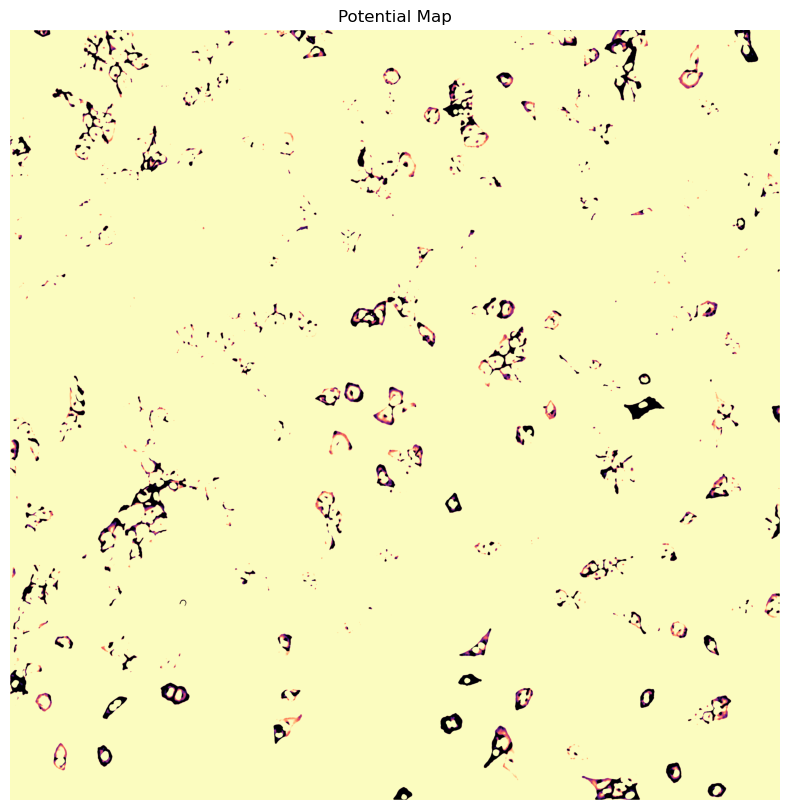

[14/03/2025 17:51:14] Removed 78 nuclei as they fell outside of the threshold range [200, 6000].
[14/03/2025 17:51:15] Total time to perform cytosol size filtering: 3.809983968734741 seconds
[14/03/2025 17:51:17] Segmentation seg_all_nucleus written to sdata object.
[14/03/2025 17:51:17] Points centers_seg_all_nucleus written to sdata object.
[14/03/2025 17:51:17] Segmentation seg_all_cytosol written to sdata object.
[14/03/2025 17:51:17] Points centers_seg_all_cytosol written to sdata object.


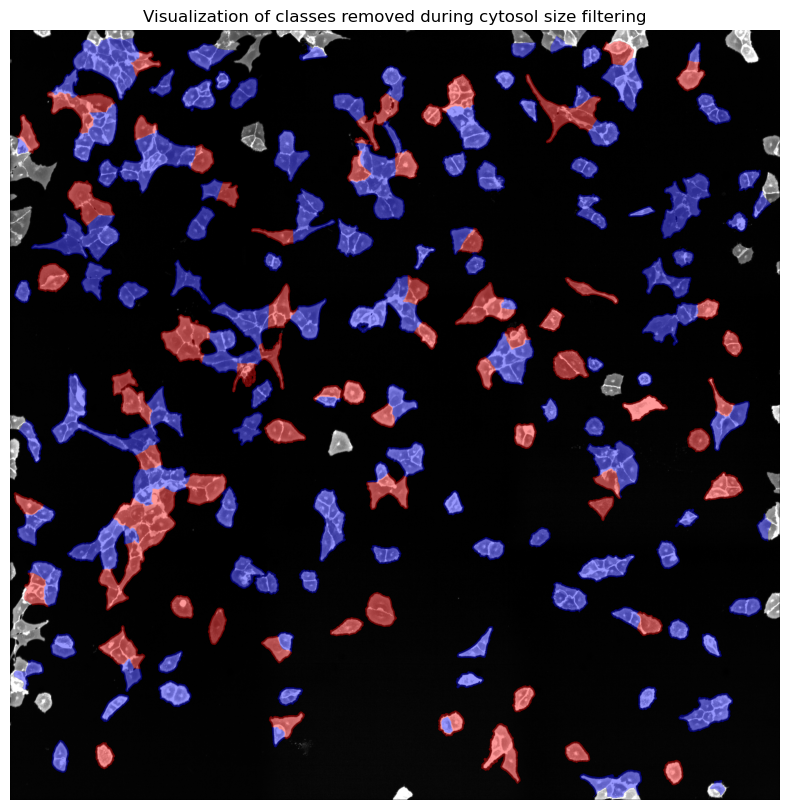

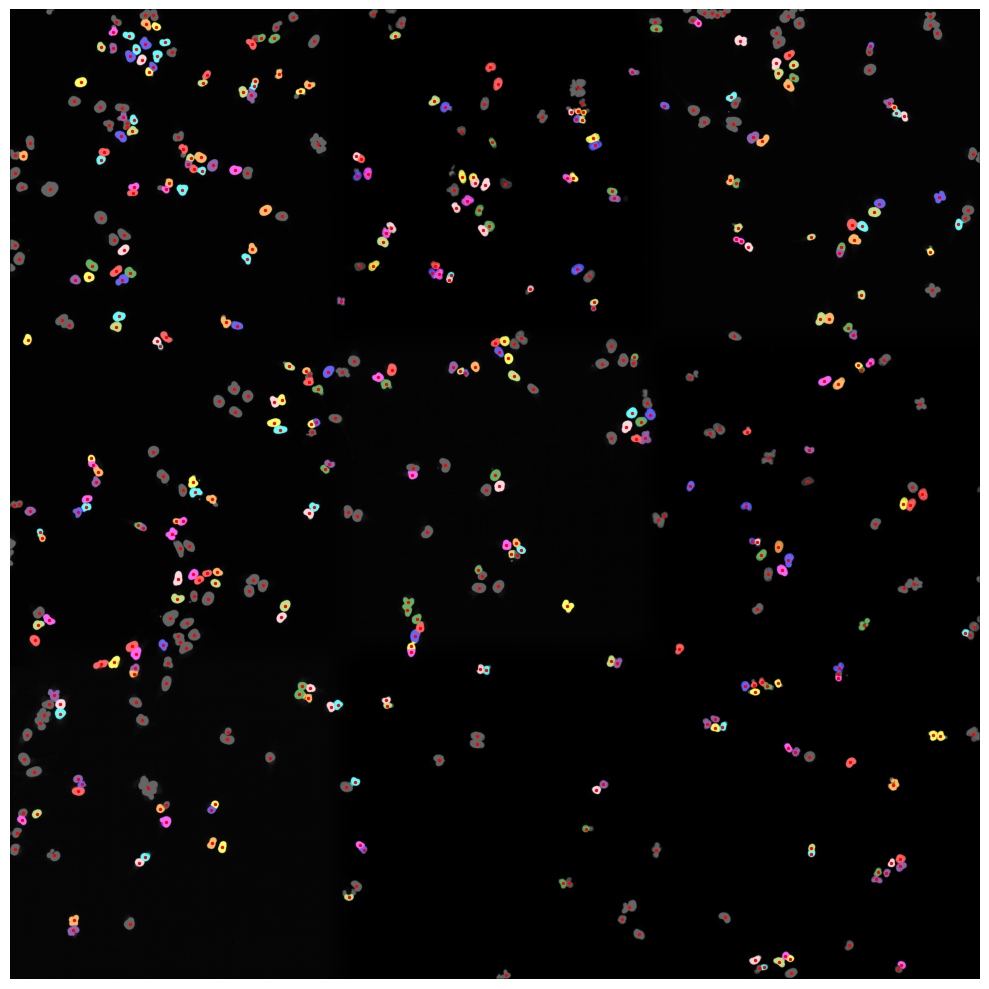

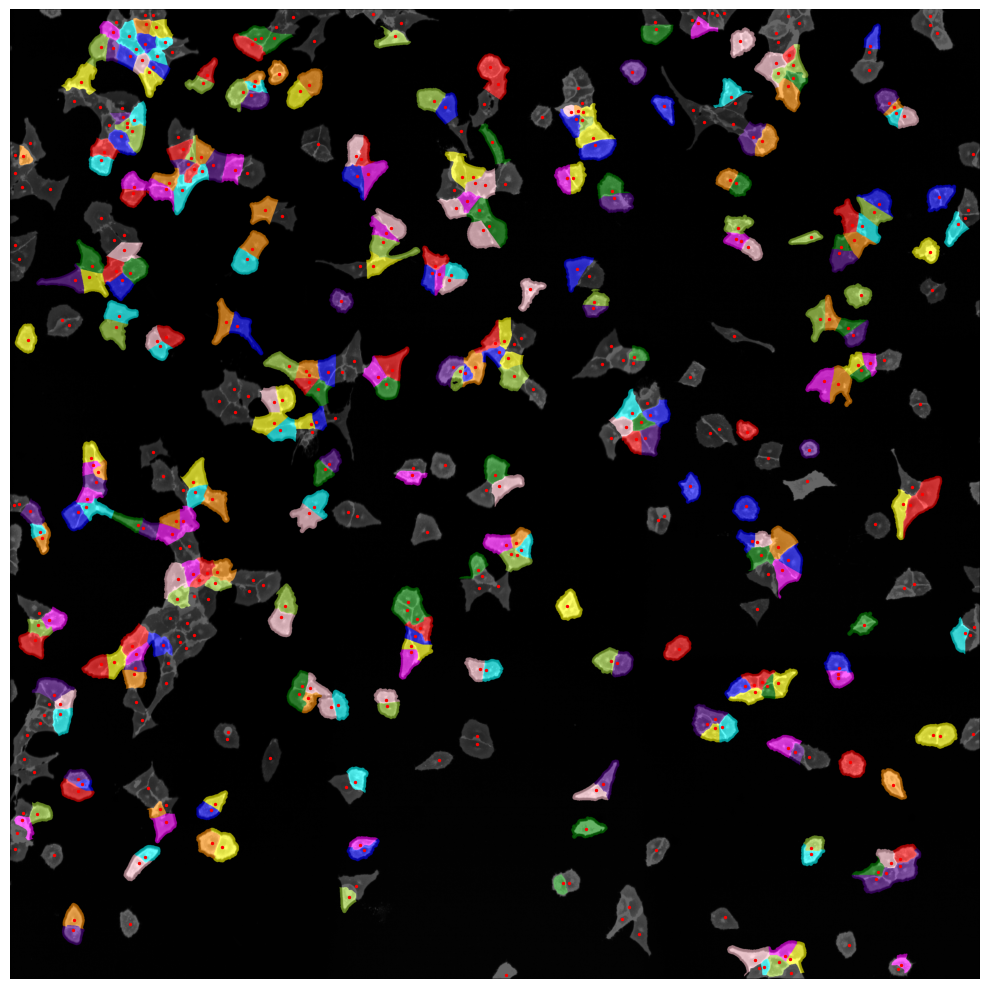

2025-03-14 17:51:20.312 python[22070:61745967] +[IMKClient subclass]: chose IMKClient_Modern
2025-03-14 17:51:20.312 python[22070:61745967] +[IMKInputSession subclass]: chose IMKInputSession_Modern
2025-03-14 17:51:20.317 python[22070:61745967] _TIPropertyValueIsValid called with 16 on nil context!
2025-03-14 17:51:20.317 python[22070:61745967] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-03-14 17:51:20.317 python[22070:61745967] Text input context does not respond to _valueForTIProperty:


In [ ]:
project.segment()

### Inspecting Segmentation Results
Depending on the segmentation method chosen, scPortrait will generate either a single segmentation mask consisting of nuclear or cytosolic segmentation, or both a nuclear and a cytosolic segmentation mask. The resulting masks are stored in the underlying spatialdata object. The labels are annotated with either cytosol or nucleus to indicate which cellular structure has been annotaed. 

You can access the spatialdata object with the shortcut `project.sdata`. Please note that this is only a copy of the object. In case you make any changes (e.g. adding a new element, etc.) you will manually need to write these changes back to disk.

In our case `seg_all_cytosol` and `seg_all_nucleus` have been added to our spatialdata object.

In [11]:
project.sdata

SpatialData object, with associated Zarr store: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/scportrait.sdata
├── Images
│     └── 'input_image': DataTree[cyx] (3, 3040, 3038), (3, 1520, 1519), (3, 380, 379), (3, 47, 47)
├── Labels
│     ├── 'seg_all_cytosol': DataArray[yx] (3040, 3038)
│     └── 'seg_all_nucleus': DataArray[yx] (3040, 3038)
└── Points
      ├── 'centers_seg_all_cytosol': DataFrame with shape: (<Delayed>, 2) (2D points)
      └── 'centers_seg_all_nucleus': DataFrame with shape: (<Delayed>, 2) (2D points)
with coordinate systems:
    ▸ 'global', with elements:
        input_image (Images), seg_all_cytosol (Labels), seg_all_nucleus (Labels), centers_seg_all_cytosol (Points), centers_seg_all_nucleus (Points)

You can also easily visualize the segmentation results using the `plot_segmentation_masks` method.

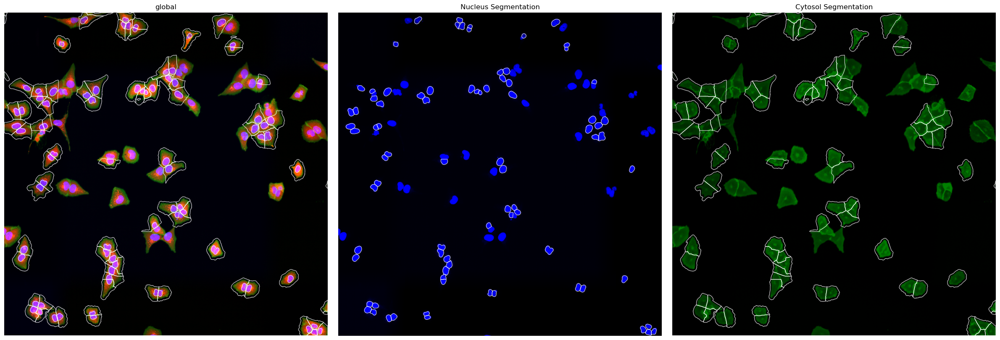

In [12]:
project.plot_segmentation_masks()

In general the resulting segmentation masks consist of arrays where each pixel is assigned either to background (`0`) or to a specific cell (`cellid: whole number`).
If we zoom in on the corner of the segmentation mask of a nucleus the numpy array would look like this:

[[395 395 395 395 395 395   0   0   0   0]
 [395 395 395 395 395 395 395 395   0   0]
 [395 395 395 395 395 395 395 395 395   0]
 [395 395 395 395 395 395 395 395 395   0]
 [395 395 395 395 395 395 395 395 395 395]
 [395 395 395 395 395 395 395 395 395 395]
 [395 395 395 395 395 395 395 395 395 395]
 [395 395 395 395 395 395 395 395 395 395]
 [395 395 395 395 395 395 395 395 395 395]
 [395 395 395 395 395 395 395 395 395 395]
 [395 395 395 395 395 395 395 395 395 395]
 [395 395 395 395 395 395 395 395 395   0]
 [395 395 395 395 395 395 395 395 395   0]
 [395 395 395 395 395 395 395 395   0   0]
 [395 395 395 395 395 395   0   0   0   0]
 [395 395 395 395   0   0   0   0   0   0]
 [395 395   0   0   0   0   0   0   0   0]
 [395   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0]]


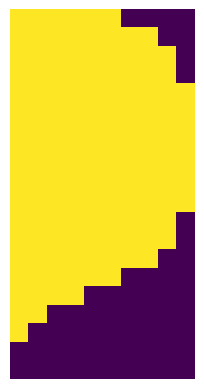

In [13]:
plt.imshow(project.sdata.labels["seg_all_nucleus"][230:250, 945:955])
plt.axis("off")
print(project.sdata.labels["seg_all_nucleus"][230:250, 945:955].data.compute())

So the mask we are looking at is of the cell with the ID `395`. And for each pixel at this location we know if it belongs to the cell or not.

## Extracting single cell images

Once we have generated a segmentation mask, the next step is to extract single-cell images of segmented cells in the dataset. To do this we will use the `HDF5CellExtraction` method. 

The parameters with which `HDF5CellExtraction` will run are again specified in the `config.yml` file.

In [14]:
display(Markdown(f"```yaml\n{yaml.dump(project.extraction_f.config, default_flow_style=False)}\n```"))

```yaml
cache: .
compression: true
image_size: 128
threads: 80

```

In [15]:
project.extract()

[14/03/2025 17:51:21] Initialized temporary directory at /var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./HDF5CellExtraction_o53syap9 for HDF5CellExtraction
[14/03/2025 17:51:21] Created new directory for extraction results: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/extraction/data
[14/03/2025 17:51:21] Setup output folder at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/extraction/data
[14/03/2025 17:51:21] Found 2 segmentation masks for the given key in the sdata object. Will be extracting single-cell images based on these masks: ['seg_all_nucleus', 'seg_all_cytosol']
[14/03/2025 17:51:21] Using seg_all_nucleus as the main segmentation mask to determine cell centers.
[14/03/2025 17:51:21] A total of 14 cells were too close to the image border to be extracted. Their cell_ids were saved to file /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/ex

/Users/sophia/mambaforge/envs/scPortrait_dev/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/sophia/mambaforge/envs/scPortrait_dev/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


[14/03/2025 17:51:22] Finished transferring data to memory mapped arrays. Time taken: 0.25 seconds.
[14/03/2025 17:51:22] Using batch size of 100 for multiprocessing.
[14/03/2025 17:51:22] Running in multiprocessing mode with 4 threads.


Extracting cell batches:   0%|          | 0/4 [00:00<?, ?it/s]

[14/03/2025 17:51:27] Finished extraction in 5.56 seconds (56.52 cells / second)
[14/03/2025 17:51:27] Benchmarking times saved to file.
[14/03/2025 17:51:27] Cleaned up temporary directory at <TemporaryDirectory '/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./HDF5CellExtraction_o53syap9'>


### Extracted single cell images

The extracted single-cell images are written to a standardized file format`single_cells.h5sc` located under `extraction\data` within the project folder. This data format is built around [AnnData](https://github.com/scverse/anndata). You can easily read the data into an AnnData object allowing you to work with the annotations while keeping the actual single-cell images in memory using the `read_h5sc` function provided with scportrait.

In [16]:
h5sc = scportrait.io.read_h5sc(project.extraction_f.extraction_file)
h5sc

AnnData object with n_obs × n_vars = 314 × 0 backed at '/Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/extraction/data/single_cells.h5sc'
    obs: 'cell_id'
    var: 'seg_all_nucleus', 'seg_all_cytosol', 'Nucleus', 'Cytosol Marker', 'LC3B'
    uns: 'single_cell_images'
    obsm: 'single_cell_images'

Alternatively, each project provides a shortcut to its generated h5sc dataset if available.

In [17]:
project.h5sc

AnnData object with n_obs × n_vars = 314 × 0 backed at '/Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/extraction/data/single_cells.h5sc'
    obs: 'cell_id'
    var: 'seg_all_nucleus', 'seg_all_cytosol', 'Nucleus', 'Cytosol Marker', 'LC3B'
    uns: 'single_cell_images'
    obsm: 'single_cell_images'

Within this format all single-cell images are stored in `obsm['single_cell_images']` where each row is a cell and each column is a channel. Additional metadata about how the single-cell images are normalized, which channel is located at which position or how many cells can be found in the dataset is stored in `uns['single_cell_images']`.

In [18]:
display("Single cell image dataset:", h5sc.obsm["single_cell_images"])
display("Metadata:", h5sc.uns["single_cell_images"])

'Single cell image dataset:'

<HDF5 dataset "single_cell_images": shape (314, 5, 128, 128), type "<f2">

'Metadata:'

{'channel_mapping': array(['mask', 'mask', 'image_channel', 'image_channel', 'image_channel'],
       dtype=object),
 'channel_names': array(['seg_all_nucleus', 'seg_all_cytosol', 'Nucleus', 'Cytosol Marker',
        'LC3B'], dtype=object),
 'compression': 'lzf',
 'image_size': 128,
 'n_cells': 314,
 'n_channels': 5,
 'n_image_channels': 3,
 'n_masks': 2,
 'normalization': True,
 'normalization_range_lower': 0.01,
 'normalization_range_upper': 0.99}

Each image is mapped to a unique cell_id letting you trace cells back to their original location within the image. `cell_ids` are stored in the `obs` slot along with any other annotation. Lets look at an example.

In [19]:
h5sc.obs

,cell_id
0,12
1,13
2,15
3,18
4,33
...,...
309,491
310,493
311,494
312,495


If we now get the image of the cell with the id `18` we can see that it consists of a stack of 5 different views. First the two masks (nucleus and cytosol) followed by the cropped view of the three different channels in our input image.

(5, 128, 128)


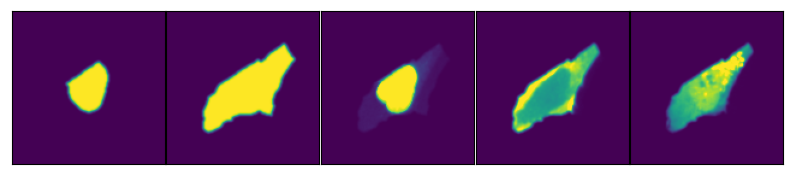

In [20]:
cell_id = 18
image_of_cell = scportrait.tl.h5sc.get_image_with_cellid(h5sc, cell_id)
print(image_of_cell.shape)
fig, axs = plt.subplots(1, 1, figsize=(2 * 5, 2))
scportrait.pl.h5sc._plot_image_grid(ax=axs, images=image_of_cell, nrows=1, ncols=5)

To make visualization easier scPortrait provides some plotting functions which will automatically generate these types of plots for you.

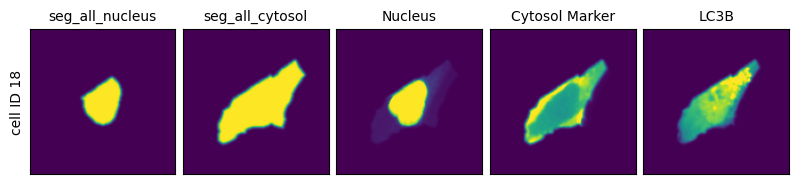

In [21]:
scportrait.pl.cell_grid(h5sc, cell_ids=cell_id)

You can also visualize randomly selected cells or also only a single image channel.

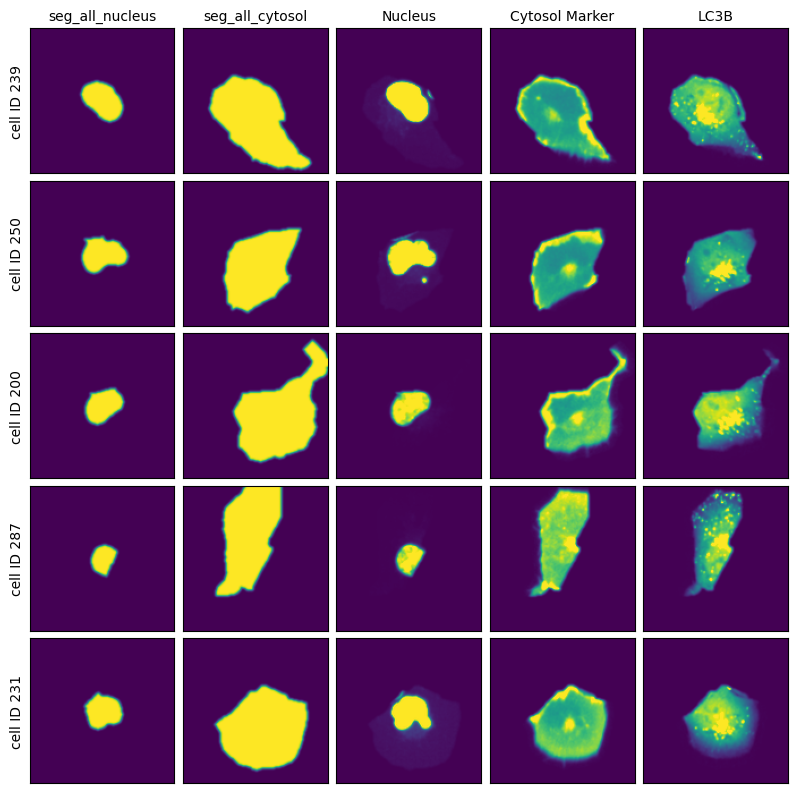

In [22]:
project.plot_single_cell_images()

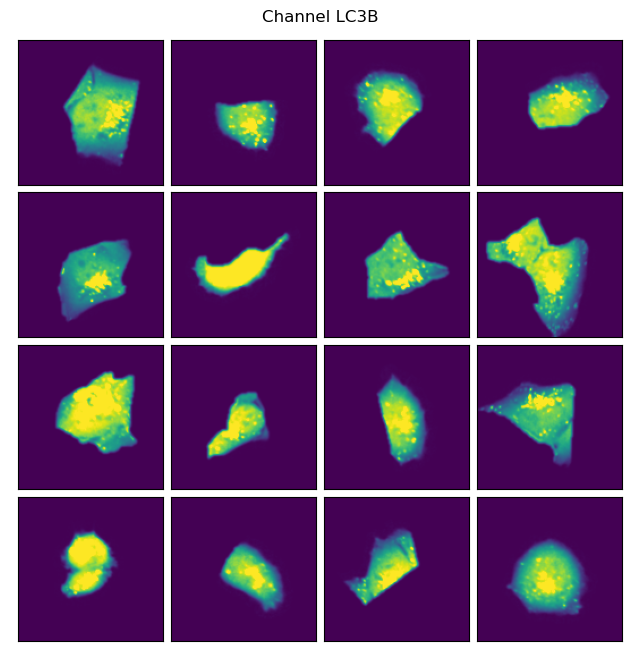

In [23]:
project.plot_single_cell_images(select_channel="LC3B")

## Classification of extracted single cells

Next we can apply a pretained model to classify our cells within the scPortrait project. 

Within the `config.yml` we specify which model should be used for inference and we can give it a name. 

                MLClusterClassifier:
                    channel_selection: 4
                    batch_size: 900
                    dataloader_worker_number: 10
                    network: "autophagy_classifier2"
                    classifier_architecture: "VGG2_old"
                    label: "Autophagy_15h_classifier2.1"
                    inference_device: "cpu"



In [24]:
display(Markdown(f"```yaml\n{yaml.dump(project.featurization_f.config, default_flow_style=False)}\n```"))

```yaml
batch_size: 900
cache: /Users/sophia/Documents/GitHub/scPortrait/docs/pages/notebooks
channel_selection: 4
dataloader_worker_number: 10
encoders:
- forward
inference_device: cpu
label: Autophagy_15h_classifier2_1
network: autophagy_classifier

```

Here e.g. we are using a pretrained model included within the scPortrait library `autophagy_classifier2.1` and are naming the results from this model `Autophagy_15h_classifier2.1`. 

Model overview:

<img src="../images/classifying_autophagy.png" alt="autophagy classification with example cells" width="800"/>


The inference results will be written to a new folder generated under `featurization` with this name. 

If we want to use a model we trained ourselves that is not yet included within the scPortrait library we can simply replace the network name in the config with the path to the checkpoint file generated by pytorch.


In [25]:
project.featurize()

Lightning automatically upgraded your loaded checkpoint from v1.5.5 to v2.5.0.post0. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint ../../../src/scportrait/scportrait_data/vgg_autophagy_classifier/VGG2_autophagy_classifier2.1.cpkt`


Using extraction directory: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/extraction/data/single_cells.h5sc
[14/03/2025 17:51:28] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/docs/pages/notebooks/MLClusterClassifier_m08o4pte for MLClusterClassifier
[14/03/2025 17:51:28] Started MLClusterClassifier classification.
[14/03/2025 17:51:28] Overwrite flag is set, deleting existing directory for featurization results.
[14/03/2025 17:51:28] Created new directory for featurization results: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/featurization/complete_Autophagy_15h_classifier2_1
[14/03/2025 17:51:28] CPU specified in config file but MPS available on system. Consider changing the device for the next run.
[14/03/2025 17:51:28] Model class defined as <class 'scportrait.tools.ml.plmodels.MultilabelSupervisedModel'>
[14/03/2025 17:51:28] Initialized tempor

### Looking at the generated results

The results are written to an anndata object which we can access using the sdata handle.

scPortrait writes the softmax results directly to file as `ln()` for better precision. To transform these numbers back to the range between 0 and 1 we first need to apply the `np.exp` function.

In [26]:
results = project.sdata["MLClusterClassifier_Autophagy_15h_classifier2_1_forward_nucleus"].to_df()
results["cell_id"] = project.sdata["MLClusterClassifier_Autophagy_15h_classifier2_1_forward_nucleus"].obs.cell_id
results.result_0 = np.exp(results.result_0)
results.result_1 = np.exp(results.result_1)

results

,result_0,result_1,cell_id
0,0.020050,0.979950,12
1,0.000517,0.999483,13
2,0.809495,0.190505,15
3,0.206104,0.793896,18
4,0.623184,0.376816,33
...,...,...,...
309,0.033211,0.966789,491
310,0.001642,0.998358,493
311,0.000081,0.999919,494
312,0.988729,0.011271,495


Depending on the model we used what `result_0` and `result_1` represent will vary. Here we used a binary classification model were class 1 was cells deficient in autophagy. So `result_1` indicates the probability score that a cell has the label "autophagy off". `results_0` is simply `1 - result_1`


If we look at the distribution in our dataset we can see that almost all cells are classified as "autophagy defective". Since the input images were from unstimulated wt cells this matches to our expectation.

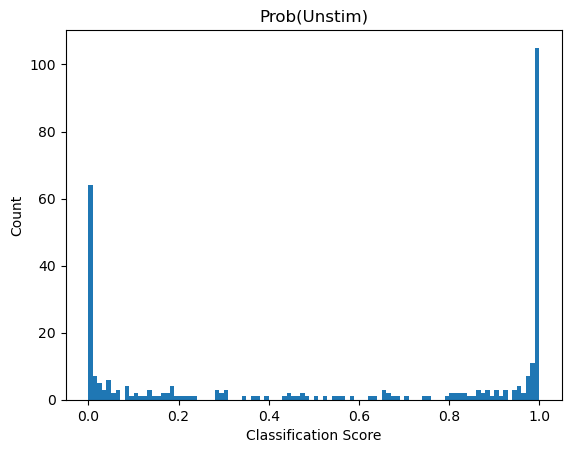

In [27]:
plt.hist(results.result_1, bins=100)
plt.title("Prob(Unstim)")
plt.xlabel("Classification Score")
plt.ylabel("Count");

Lets visualzie the cells with the highest and lowest classification scores.

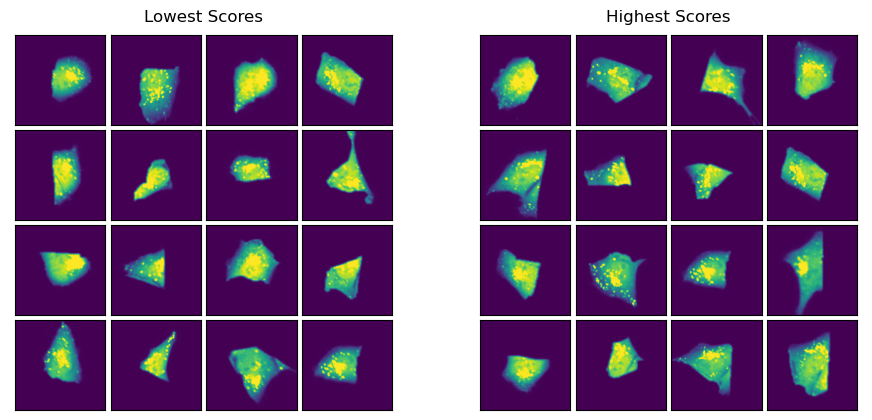

In [28]:
lowest_scores = results.sort_values("result_1").head(16)
highest_scores = results.sort_values("result_1").tail(16)

fig, axs = plt.subplots(1, 2, figsize=(11, 5))
scportrait.pl.cell_grid_single_channel(
    project.h5sc,
    cell_ids=lowest_scores.cell_id.tolist(),
    select_channel="LC3B",
    ax=axs[0],
    show_fig=False,
    title="Lowest Scores",
)
scportrait.pl.cell_grid_single_channel(
    project.h5sc,
    cell_ids=highest_scores.cell_id.tolist(),
    select_channel="LC3B",
    ax=axs[1],
    show_fig=False,
    title="Highest Scores",
)

Since these cells are all from the same condition we don't expect to see big differences between the cells with the lowest and those with the highest score.

## Exporting Cutting contours for excision on a Leica LMD7

scPortrait directly interfaces with our other open-source python library [py-lmd](https://github.com/MannLabs/py-lmd) to easily select and export cells for excision on a Leica LMD microscope. 

Of note: this will require that the cells have been plates on a LMD compatible surface (like a PPS slide). scPortrait can of course also simply be used for data analysis procedures, then ignore this last step.

First we will select the cells we wish to excise based on their classification score. Here we have chosen a threadhold >= 0.99999 for bin1 and a threshold <= 0.9 for bin2. 

In [29]:
cell_ids_bin1 = results[results.result_1 >= 0.99999].cell_id.tolist()
cell_ids_bin2 = results[results.result_1 <= 0.9].cell_id.tolist()

print("number of cells to excise:", len(cell_ids_bin1) + len(cell_ids_bin2))

number of cells to excise: 192


The cells can then be allocated into different wells.

In [30]:
cells_to_select = [
    {"name": "bin1", "classes": list(cell_ids_bin1), "well": "A1"},
    {"name": "bin2", "classes": list(cell_ids_bin2), "well": "B1"},
]

In addition to defining which cells we want to excise, we also need to pass the location of the calibration crosses so that we can transfer the image coordinate system into a cutting coordinate system. You can read up on this [here](https://mannlabs.github.io/py-lmd/html/pages/segmentation_loader.html#different-coordinate-systems).

To obtain the coordinates of your reference points simply open your stitched image in e.g. FIJI and navigate to the location of your reference points. Then write out the coordinates for each point.

In [31]:
marker_0 = (0, 0)
marker_1 = (2000, 0)
marker_2 = (0, 2000)

calibration_marker = np.array([marker_0, marker_1, marker_2])

As with the previous methods, additional parameters can be passed to the selection function via the `config.yml` file which adapts the behaviour of how cutting shapes are generated. You can read up more on this [here](https://mannlabs.github.io/py-lmd/html/pages/segmentation_loader.html#overview-of-configuration).



In [32]:
display(Markdown(f"```yaml\n{yaml.dump(project.selection_f.config, default_flow_style=False)}\n```"))

```yaml
cache: .
greedy_k: 15
hilbert_p: 7
orientation_transform:
- - 0
  - -1
- - 1
  - 0
path_optimization: hilbert
poly_compression_factor: 30
processes_cell_sets: 2
segmentation_channel: seg_all_nucleus
shape_dilation: 16
smoothing_filter_size: 25
threads: 20

```

[14/03/2025 17:51:32] Initialized temporary directory at /var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./LMDSelection_xgmhdel3 for LMDSelection
[14/03/2025 17:51:32] Selection process started.


Processing cell batches:   0%|          | 0/2 [00:00<?, ?it/s]

[14/03/2025 17:51:41] Temporary directory not found, skipping cleanup
[14/03/2025 17:51:41] Temporary directory not found, skipping cleanup
[14/03/2025 17:51:41] Coordinate lookup index calculation took 9.514497375115752 seconds.
No configuration for shape_erosion found, parameter will be set to 0
No configuration for binary_smoothing found, parameter will be set to 3
No configuration for convolution_smoothing found, parameter will be set to 15
No configuration for rdp_epsilon found, parameter will be set to 0.1
No configuration for xml_decimal_transform found, parameter will be set to 100
No configuration for distance_heuristic found, parameter will be set to 300
No configuration for join_intersecting found, parameter will be set to True
Path optimizer used for XML generation: hilbert
cell set 0 passed sanity check
cell set 1 passed sanity check
Loading coordinates from external source
Processing cell sets in parallel


collecting cell sets:   0%|          | 0/2 [00:00<?, ?it/s]

Convert label format into coordinate format
Convert label format into coordinate format
Conversion finished, performing sanity check.
Intersecting Shapes will be merged into a single shape.
Conversion finished, performing sanity check.
Intersecting Shapes will be merged into a single shape.


dilating shapes: 100%|██████████| 175/175 [00:03<00:00, 50.84it/s]


0 shapes that were intersecting were found and merged.


creating shapes:   0%|          | 0/16 [00:00<?, ?it/s]

0 shapes that were intersecting were found and merged.


calculating polygons: 100%|██████████| 16/16 [00:03<00:00,  5.02it/s]


Current path length: 22,306.05 units


calculating polygons:   1%|▏         | 1/80 [00:02<03:24,  2.59s/it]

Optimized path length: 9,837.50 units
Optimization factor: 2.3x
Plotting shapes in debug mode is not supported in multi-threading mode.
Saving plots to disk instead.


calculating polygons: 100%|██████████| 80/80 [00:03<00:00, 23.02it/s]


Current path length: 109,484.75 units
Optimized path length: 24,906.79 units
Optimization factor: 4.4x
Plotting shapes in debug mode is not supported in multi-threading mode.
Saving plots to disk instead.


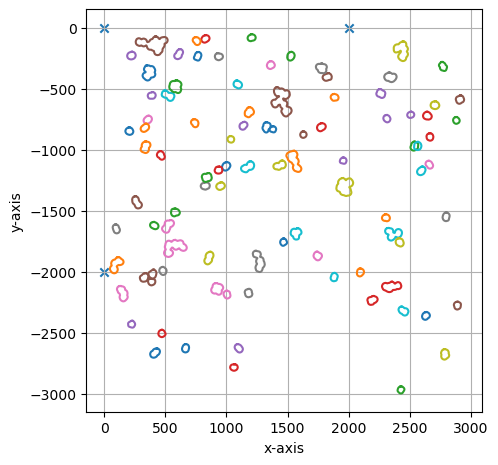

===== Collection Stats =====
Number of shapes: 96
Number of vertices: 8,036
Mean vertices: 84
Min vertices: 53
5% percentile vertices: 59
Median vertices: 68
95% percentile vertices: 160
Max vertices: 287
[0 0]
[      0 -200000]
[200000      0]
[14/03/2025 17:51:55] Saved output at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/selection/bin1_bin2.xml
[14/03/2025 17:51:55] Cleaned up temporary directory at <TemporaryDirectory '/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./LMDSelection_xgmhdel3'>


In [33]:
project.select(cells_to_select, calibration_marker)